Домашняя работа к лексции 2 по курсу Машинное обучение.
---------
Студента: **Помойницкого Евгения**

Группа: **DS 8**

Имеются данные adult.csv (см. в материалах к занятию)

Целевой переменной является уровень дохода income (крайний правый столбец).

Описание признаков можно найти по ссылке http://www.cs.toronto.edu/~delve/data/adult/adultDetail.html

Вам необходимо построить модель логистической регрессии, которая предсказывает уровень дохода человека. При возможности попробуйте улучшить точность предсказаний (метод score) с помощью перебора признаков.

In [94]:
import pandas as pd
import numpy as np
import pandas_profiling
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [95]:
df = pd.read_csv('adult.csv')
df.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


In [96]:
df.profile_report()

Видим, что:
1. датасет содержит много категориальных признаков, потребуется их векторизация через OHE или get_dummies;
2. целевой признак имеет 2 значения, что видно и в profile report и при запуске отдельного метода (ячейка ниже). Признак также, категориальный, в сущности. Неравенство не может в целях нашей работы считаться вещественным признаком;
3. отсутсвующих данных нет, так что обработки в этой части не требуется;
4. поскольку для категориальных признаков profile report не строит корреляции, а вещественные высоких корреляций не имеют, особого практического смысла в выделении только части признаков для модели нет;

In [97]:
df.income.unique()

array(['<=50K', '>50K'], dtype=object)

In [98]:
df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'educational-num',
       'marital-status', 'occupation', 'relationship', 'race', 'gender',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income'],
      dtype='object')

In [99]:
df['income_bin'] = df.income.apply(lambda x: 1 if x =='>50K' else 0)
df.head(3)

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income,income_bin
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K,0
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K,0
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K,1


In [100]:
y = df.income_bin
y.head()

0    0
1    0
2    1
3    1
4    0
Name: income_bin, dtype: int64

In [101]:
X = df[['age', 'workclass', 'fnlwgt', 'education', 'educational-num',
       'marital-status', 'occupation', 'relationship', 'race', 'gender',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country']]
X.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States


In [102]:
X = pd.get_dummies(X)
X.head(3)

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week,workclass_?,workclass_Federal-gov,workclass_Local-gov,workclass_Never-worked,...,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia
0,25,226802,7,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,38,89814,9,0,0,50,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,28,336951,12,0,0,40,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [104]:
model_1 = LogisticRegression(C = 10)

In [105]:
model_1.fit(X_train, y_train)
y_pred_1 = model_1.predict(X_test)

In [106]:
print (classification_report(y_test, y_pred_1))

              precision    recall  f1-score   support

           0       0.81      0.97      0.88      7479
           1       0.72      0.27      0.39      2290

    accuracy                           0.80      9769
   macro avg       0.76      0.62      0.64      9769
weighted avg       0.79      0.80      0.77      9769



In [107]:
model_2 = LogisticRegression(C = 0.5)

In [108]:
model_2.fit(X_train, y_train)
y_pred_2 = model_2.predict(X_test)

In [109]:
print (classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.81      0.97      0.88      7479
           1       0.72      0.27      0.39      2290

    accuracy                           0.80      9769
   macro avg       0.76      0.62      0.64      9769
weighted avg       0.79      0.80      0.77      9769



Видим, что изменение параметра С в функции логистической регрессии не оказывает влияния на результат предсказания. 

Попробуем посмотреть, есть ли каие-то явные корреляции между векторизованными признаками. 

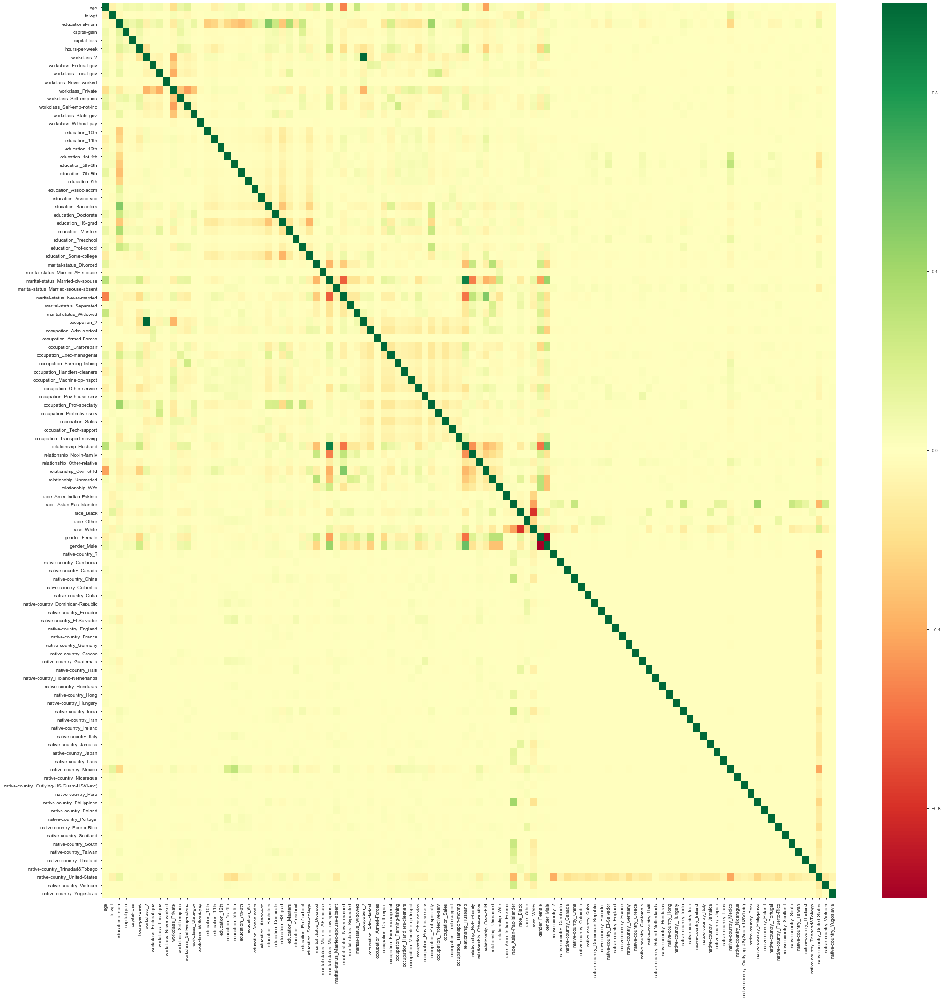

In [110]:
from pylab import rcParams
rcParams['figure.figsize'] = (35, 35)

sns.heatmap(X.corr(), annot=False, cmap='RdYlGn')

Из карты теплоты видны определенные корреляции между отельными значениями признаков, например, сильная обратна корреляция Male - Female, но это нам не дает оснований для осмысленого удаления признаков.

Попробуем использовать уменьшенный тренировочный набор, из которого уберем признаки на основании смысловой интерпретации. Например, несколько пар признаков должны коррелировать в целом, хотя это не видно на уровне векторов их значений:
- 'education' и 'educational-num';
- 'workclass' и 'occupation' ;
- 'marital-status' и 'relationship'

In [111]:
X = df[['age', 'workclass', 'fnlwgt', 'educational-num',
       'marital-status', 'race', 'gender','capital-gain', 'capital-loss',
        'hours-per-week', 'native-country']]
X = pd.get_dummies(X)

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [113]:
model = LogisticRegression(C=10)

In [114]:
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [115]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.97      0.88      7479
           1       0.72      0.27      0.39      2290

    accuracy                           0.80      9769
   macro avg       0.76      0.62      0.64      9769
weighted avg       0.79      0.80      0.77      9769



Уменьшение количества признаков не приводит к улучшению результата. Но и не ухудшает его, то есть, удаленные признаки были избыточными.